#  NorthFace

## <span style="color:red"><b>TODO & Ideas - TO BE COMMENTED</b></span>

* Faire une espece de grid search CV en faisant varier
    * 1 gram ou 2 gram
    * eps et min_sample
    * Essayer k_Trig_Common_Words = 600, 700, 800, 900, 1000, 10_000
* STOP_WORDS_extended au lieu de k_Trig_Common_Words raisonner en % du nb de mots du corpus k_Common_Words_Percent 
* ~~Voir cette histoire~~ 
    * ~~if (token.lemma_ not in STOP_WORDS) and (token.text not in STOP_WORDS)~~
* ~~virer les nombres~~
* ~~ajuster STOP_WORDS à la fin de la première pass~~
* ~~faire un histogramme des mots communs au corpus~~ 
    * ~~Pour choisir la quantité et les rajouter aux STOP_WORDS~~
    * ~~Faut pas que le pic au démarrage soit trop fin car ça veut dire  qu'on a été trop restrictif~~


# Preface

## Executive summary

## Notes about specifications

* Read : https://app.jedha.co/course/projects-unsupervised-machine-learning-ft/the-north-face-ecommerce-ft
* Recommender system 
    * will suggest additionnal products similar to the items they are interested in. 
    * could be materialized by a "you might be by interrested in..." section 
* Improving the structure of the products catalog 
    * topic extraction
    * use unsupervised methods to challenge the existing categories 
    * is it possible to find new categories of product that would be more suitable for the navigation on the website

**Goals**
1. Identify groups of products with similar descriptions
1. Use these groups to build a simple recommender system algorithm
1. Use topic modeling algorithms to automatically assess the latent topics present in the item descriptions

**Helpers**
* make some preprocessings to clean the corpus 
    * ``pandas`` and ``spacy``
    * handle stop words 
    * lemmatize the documents
* encode the texts with TF-IDF transformation 
    * scikit learn's ``TFIDFVectorizer()``

**Part 1 : Groups of products with similar descriptions**
* train a clustering model 
* create groups of products for which the descriptions are "close" to each other
* to do so, use DBSCAN to make clustering on the TF-IDF matrix
* use "cosine" instead of "euclidean" distance
* eps & min_samples to get 10-20 clusters and not too many outliers
* display a wordcloud for each cluster check if the groups contain different words
* **Delivrable** : 
    1. Train at least one clustering model on the corpus
    1. Display wordclouds describing the clusters

**Part 2 - Recommender system**
* use cluster ids from part 1 to build a recommender system
    * suggest to the user products that are similar to the ones he is interested in 
* we consider that products belonging to the same cluster are similar

* Create a function named ``find_similar_items()`` 
    * input : ``item_id``, the id of a product
    * output : a list of **5 item ids** of the same cluster 
    * Use ``input()`` to get ``item_id`` then perform suggestions
* **Delivrable** :
    1. A code that allows a user to type the ``item_id`` of a product he's interested in and get a list of similar items

**Part 3 : Topic modeling**
* Use an LSA model to extract latent topics in the products' descriptions
* Use ``TruncatedSVD()`` to make some topic extraction from the TF-IDF matrix 
* ``n_components`` should allow to get 10-20 topics
* Save the encoded matrix into a variable named ``topic_encoded_df``
* extracting the main topic of each document
    * display wordclouds to analyze the results
    * Remember 
        * LSA allows to map a document to several topics
        * it's more difficult to interpret the topics as categories 
        * Here you're asked to extract the main topic of each document
* **Delivrable** : 
    1. Train at least one ``TruncatedSVD()`` model on the corpus 
    1. Display wordclouds describing the latent topics


In [85]:
# prelude

import pandas             as pd
import spacy
import re
import en_core_web_sm                                           # python -m spacy download en_core_web_sm -q
import plotly.express     as px
import matplotlib.pyplot  as plt 

from spacy.lang.en.stop_words         import STOP_WORDS
from sklearn.feature_extraction.text  import TfidfVectorizer
from sklearn.cluster                  import DBSCAN
from sklearn.preprocessing            import normalize
from sklearn.metrics.pairwise         import cosine_similarity
from wordcloud                        import WordCloud
from sklearn.metrics.pairwise         import cosine_distances


pd.set_option('display.max_columns', None)

print(f"pandas          ver = {pd.__version__}")
print(f"spacy           ver = {spacy.__version__}")
print(f"en_core_web_sm  ver = {en_core_web_sm.__version__}")
print(f"re              ver = {re.__version__}")

# -----------------------------------------------------------------------------
k_AssetsDir               = "assets/"
k_FileName                = "sample_data.csv"
k_Gold                    = 1.618         # gold number for ratio
k_Width                   = 12
k_Height                  = int(k_Width/k_Gold)
k_WidthPx                 = 1024
k_HeightPx                = int(k_WidthPx/k_Gold)
k_random_state            = 42           
k_test_size               = 20/100  
k_Trig_Common_Words       = 1000      # above this number of occurences the word is considered as "too common" and added to STOP_WORDS  
k_ngram                   = (1, 1)    # (1, 2)    

pandas          ver = 2.1.4
spacy           ver = 3.7.2
en_core_web_sm  ver = 3.7.1
re              ver = 2.2.1


# Preprocessing


## Get the corpus

In [86]:
df = pd.read_csv(k_AssetsDir+k_FileName)
df.columns = ["item_id", "description"]
df.dropna(inplace=True)

display(df.head(10))

,item_id,description
0,1,Active classic boxers - There's a reason why o...
1,2,Active sport boxer briefs - Skinning up Glory ...
2,3,Active sport briefs - These superbreathable no...
3,4,"Alpine guide pants - Skin in, climb ice, switc..."
4,5,"Alpine wind jkt - On high ridges, steep ice an..."
5,6,Ascensionist jkt - Our most technical soft she...
6,7,"Atom - A multitasker's cloud nine, the Atom pl..."
7,8,Print banded betina btm - Our fullest coverage...
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...
9,10,Baby sun bucket hat - This hat goes on when th...


## Clean-up the documents

In [87]:
# naïve removal of HTML tags (<li> </li>...)
def handle_HTML_tag(str_in):
  str_out = re.sub(r'<[^>]+>', ' ', str_in)
  str_out = re.sub(r'</[^>]+>', ' ', str_out)
  return str_out


In [88]:
# nylon/50% => nylon 50%
def handle_Material_Percent(str_in):
  str_out = re.sub(r'(\b\w+)/(\d+%)', r'\1 \2', str_in)
  return str_out


In [89]:
# remove numbers (with and without ".") \b=word limit
def handle_Numbers(str_in):
  str_out = re.sub(r'\b\d+(?:\.\d+)?\b', '', str_in)
  return str_out


In [90]:
# replace multiple spaces with 1 (used in Final description)
def handle_Multiple_Spaces(str_in):
    str_out = re.sub(r'\s+', ' ', str_in)
    return str_out


In [91]:
# strip should be at the end
# for i in range(10):
#   print(df["description"][i])

df["clean_desc"] = df["description"].apply(lambda x: handle_HTML_tag(x)) 
df["clean_desc"] = df["clean_desc"].apply(lambda x: handle_Material_Percent(x)) 
df["clean_desc"] = df["clean_desc"].apply(lambda x: handle_Numbers(x)) 
df["clean_desc"] = df["clean_desc"].apply(lambda x: re.sub('[!\"#$%&()*+,-./:;<=>?@\[\]^_`{|}~\\\]+', " ", x)) # does not remove, replace with " "
df["clean_desc"] = df["clean_desc"].apply(lambda x: x.lower())
df["clean_desc"] = df["clean_desc"].apply(lambda x: x.strip())

display(df.head(10))

# print()
# for i in range(10):
#   print(df["clean_desc"][i])

,item_id,description,clean_desc
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...


## Load in spaCy doc objects

In [92]:
nlp = en_core_web_sm.load()
df['spacy_object'] = df['clean_desc'].apply(lambda x: nlp(x))
display(df.head(10))

,item_id,description,clean_desc,spacy_object
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...,"(active, classic, boxers, , there, 's, a, re..."
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...,"(active, sport, boxer, briefs, , skinning, u..."
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...,"(active, sport, briefs, , these, superbreath..."
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...,"(alpine, guide, pants, , skin, in, , climb,..."
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...,"(alpine, wind, jkt, , on, high, ridges, , s..."
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...,"(ascensionist, jkt, , our, most, technical, ..."
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...,"(atom, , a, multitasker, 's, cloud, nine, ,..."
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...,"(print, banded, betina, btm, , our, fullest,..."
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...,"(baby, micro, d, luxe, cardigan, , micro, d,..."
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...,"(baby, sun, bucket, hat, , this, hat, goes, ..."


## Lemmatization taking STOP_WORDS into account

In [93]:
additional_words = []                     # ["bob"] 
for w in additional_words:
  STOP_WORDS.add(w)

df['lemma'] = df['spacy_object'].apply(lambda x: [token.lemma_ for token in x if (token.lemma_ not in STOP_WORDS) and (token.text not in STOP_WORDS)])
display(df.head(10))

,item_id,description,clean_desc,spacy_object,lemma
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...,"(active, classic, boxers, , there, 's, a, re...","[active, classic, boxer, , reason, boxer, cu..."
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...,"(active, sport, boxer, briefs, , skinning, u...","[active, sport, boxer, brief, , skin, glory,..."
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...,"(active, sport, briefs, , these, superbreath...","[active, sport, brief, , superbreathable, fl..."
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...,"(alpine, guide, pants, , skin, in, , climb,...","[alpine, guide, pant, , skin, , climb, ice,..."
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...,"(alpine, wind, jkt, , on, high, ridges, , s...","[alpine, wind, jkt, , high, ridge, , steep,..."
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...,"(ascensionist, jkt, , our, most, technical, ...","[ascensionist, jkt, , technical, soft, shell..."
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...,"(atom, , a, multitasker, 's, cloud, nine, ,...","[atom, , multitasker, cloud, , atom, play, ..."
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...,"(print, banded, betina, btm, , our, fullest,...","[print, band, betina, btm, , coverage, , be..."
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...,"(baby, micro, d, luxe, cardigan, , micro, d,...","[baby, micro, d, luxe, cardigan, , micro, d,..."
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...,"(baby, sun, bucket, hat, , this, hat, goes, ...","[baby, sun, bucket, hat, , hat, sun, rise, h..."


## Final description ?

In [94]:
df['final_desc'] = df['lemma'].apply(lambda x: ' '.join(x))
display(df.head(10))
print(df.shape)

,item_id,description,clean_desc,spacy_object,lemma,final_desc
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...,"(active, classic, boxers, , there, 's, a, re...","[active, classic, boxer, , reason, boxer, cu...",active classic boxer reason boxer cult favo...
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...,"(active, sport, boxer, briefs, , skinning, u...","[active, sport, boxer, brief, , skin, glory,...",active sport boxer brief skin glory require...
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...,"(active, sport, briefs, , these, superbreath...","[active, sport, brief, , superbreathable, fl...",active sport brief superbreathable fly brie...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...,"(alpine, guide, pants, , skin, in, , climb,...","[alpine, guide, pant, , skin, , climb, ice,...",alpine guide pant skin climb ice switch...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...,"(alpine, wind, jkt, , on, high, ridges, , s...","[alpine, wind, jkt, , high, ridge, , steep,...",alpine wind jkt high ridge steep ice alpi...
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...,"(ascensionist, jkt, , our, most, technical, ...","[ascensionist, jkt, , technical, soft, shell...",ascensionist jkt technical soft shell mount...
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...,"(atom, , a, multitasker, 's, cloud, nine, ,...","[atom, , multitasker, cloud, , atom, play, ...",atom multitasker cloud atom play courier ...
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...,"(print, banded, betina, btm, , our, fullest,...","[print, band, betina, btm, , coverage, , be...",print band betina btm coverage betina fit...
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...,"(baby, micro, d, luxe, cardigan, , micro, d,...","[baby, micro, d, luxe, cardigan, , micro, d,...",baby micro d luxe cardigan micro d luxe hea...
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...,"(baby, sun, bucket, hat, , this, hat, goes, ...","[baby, sun, bucket, hat, , hat, sun, rise, h...",baby sun bucket hat hat sun rise horizon ...


(500, 6)


## Compute TF_IDF

In [95]:
vectorizer = TfidfVectorizer(ngram_range = k_ngram)    # default ngram_range=(1, 1) ngram_range=(1, 2)
X = vectorizer.fit_transform(df["final_desc"])

tfid_df           = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())
tfid_df           = tfid_df.T
tfid_df["token"]  = tfid_df.index
tfid_df           = tfid_df.sort_values(by=0, ascending=False)[:10].round(2)
display(tfid_df[0])


boxer          0.54
expose         0.27
traditional    0.23
classic        0.18
especially     0.17
reason         0.17
situation      0.16
cult           0.16
panel          0.15
brush          0.15
Name: 0, dtype: float64

## Extend STOP_WORDS with most common words of the dataset

In [96]:
# List the most common words of the corpus
# split each row of final_desc into separate columns (see expand=True)
# stack them all (a kind of transpose and paste). There are 2 levels of indexes
word_series = df['final_desc'].str.split(expand=True).stack()
# display(word_series.head(10))


# get a count of every occurences in a Series
word_counts = word_series.value_counts()
print(word_counts.head(10))

# the 3 first words count for 5.6% and the 6 first words for 10%
# tmp = 100*word_counts/word_counts.sum()
# print(tmp.cumsum(0).head(10))

# print(len(STOP_WORDS))
STOP_WORDS_extended = STOP_WORDS.union(word_counts[word_counts>=k_Trig_Common_Words])
# print(len(STOP_WORDS_extended))


oz            1147
fabric        1000
pocket         843
recycle        784
polyester      708
recyclable     704
thread         686
common         684
program        683
detail         564
Name: count, dtype: int64


In [97]:
fig = px.bar(word_counts[:100], width=k_WidthPx, height=k_HeightPx)
fig.update_layout(
    title="# of occurences of the 100 first words of the corpus"
)

fig.show()

In [98]:
fig = px.bar(word_counts[:20], width=k_WidthPx, height=k_HeightPx)
fig.update_layout(
    title="# of occurences of the 20 first words of the corpus"
)

fig.show()

## Lemmatization2 taking the extended version of STOP_WORDS into account 

In [99]:
# if (token.lemma_ not in STOP_WORDS) and (token.text not in STOP_WORDS)])
df['lemma2'] = df['spacy_object'].apply(lambda x: [token.lemma_ for token in x if (token.lemma_ not in STOP_WORDS_extended) and (token.text not in STOP_WORDS_extended)])
display(df.head(10))

,item_id,description,clean_desc,spacy_object,lemma,final_desc,lemma2
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...,"(active, classic, boxers, , there, 's, a, re...","[active, classic, boxer, , reason, boxer, cu...",active classic boxer reason boxer cult favo...,"[active, classic, boxer, , reason, boxer, cu..."
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...,"(active, sport, boxer, briefs, , skinning, u...","[active, sport, boxer, brief, , skin, glory,...",active sport boxer brief skin glory require...,"[active, sport, boxer, brief, , skin, glory,..."
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...,"(active, sport, briefs, , these, superbreath...","[active, sport, brief, , superbreathable, fl...",active sport brief superbreathable fly brie...,"[active, sport, brief, , superbreathable, fl..."
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...,"(alpine, guide, pants, , skin, in, , climb,...","[alpine, guide, pant, , skin, , climb, ice,...",alpine guide pant skin climb ice switch...,"[alpine, guide, pant, , skin, , climb, ice,..."
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...,"(alpine, wind, jkt, , on, high, ridges, , s...","[alpine, wind, jkt, , high, ridge, , steep,...",alpine wind jkt high ridge steep ice alpi...,"[alpine, wind, jkt, , high, ridge, , steep,..."
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...,"(ascensionist, jkt, , our, most, technical, ...","[ascensionist, jkt, , technical, soft, shell...",ascensionist jkt technical soft shell mount...,"[ascensionist, jkt, , technical, soft, shell..."
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...,"(atom, , a, multitasker, 's, cloud, nine, ,...","[atom, , multitasker, cloud, , atom, play, ...",atom multitasker cloud atom play courier ...,"[atom, , multitasker, cloud, , atom, play, ..."
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...,"(print, banded, betina, btm, , our, fullest,...","[print, band, betina, btm, , coverage, , be...",print band betina btm coverage betina fit...,"[print, band, betina, btm, , coverage, , be..."
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...,"(baby, micro, d, luxe, cardigan, , micro, d,...","[baby, micro, d, luxe, cardigan, , micro, d,...",baby micro d luxe cardigan micro d luxe hea...,"[baby, micro, d, luxe, cardigan, , micro, d,..."
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...,"(baby, sun, bucket, hat, , this, hat, goes, ...","[baby, sun, bucket, hat, , hat, sun, rise, h...",baby sun bucket hat hat sun rise horizon ...,"[baby, sun, bucket, hat, , hat, sun, rise, h..."


## 

## Final description

In [100]:

df['final_desc2'] = df['lemma2'].apply(lambda x: ' '.join(x))
df['final_desc2'] = df['final_desc2'].apply(lambda x: handle_Multiple_Spaces(x))
display(df.head(10))
print(df.shape)

,item_id,description,clean_desc,spacy_object,lemma,final_desc,lemma2,final_desc2
0,1,Active classic boxers - There's a reason why o...,active classic boxers there's a reason why o...,"(active, classic, boxers, , there, 's, a, re...","[active, classic, boxer, , reason, boxer, cu...",active classic boxer reason boxer cult favo...,"[active, classic, boxer, , reason, boxer, cu...",active classic boxer reason boxer cult favorit...
1,2,Active sport boxer briefs - Skinning up Glory ...,active sport boxer briefs skinning up glory ...,"(active, sport, boxer, briefs, , skinning, u...","[active, sport, boxer, brief, , skin, glory,...",active sport boxer brief skin glory require...,"[active, sport, boxer, brief, , skin, glory,...",active sport boxer brief skin glory require mo...
2,3,Active sport briefs - These superbreathable no...,active sport briefs these superbreathable no...,"(active, sport, briefs, , these, superbreath...","[active, sport, brief, , superbreathable, fl...",active sport brief superbreathable fly brie...,"[active, sport, brief, , superbreathable, fl...",active sport brief superbreathable fly brief m...
3,4,"Alpine guide pants - Skin in, climb ice, switc...",alpine guide pants skin in climb ice switc...,"(alpine, guide, pants, , skin, in, , climb,...","[alpine, guide, pant, , skin, , climb, ice,...",alpine guide pant skin climb ice switch...,"[alpine, guide, pant, , skin, , climb, ice,...",alpine guide pant skin climb ice switch rock t...
4,5,"Alpine wind jkt - On high ridges, steep ice an...",alpine wind jkt on high ridges steep ice an...,"(alpine, wind, jkt, , on, high, ridges, , s...","[alpine, wind, jkt, , high, ridge, , steep,...",alpine wind jkt high ridge steep ice alpi...,"[alpine, wind, jkt, , high, ridge, , steep,...",alpine wind jkt high ridge steep ice alpine ja...
5,6,Ascensionist jkt - Our most technical soft she...,ascensionist jkt our most technical soft she...,"(ascensionist, jkt, , our, most, technical, ...","[ascensionist, jkt, , technical, soft, shell...",ascensionist jkt technical soft shell mount...,"[ascensionist, jkt, , technical, soft, shell...",ascensionist jkt technical soft shell mountain...
6,7,"Atom - A multitasker's cloud nine, the Atom pl...",atom a multitasker's cloud nine the atom pl...,"(atom, , a, multitasker, 's, cloud, nine, ,...","[atom, , multitasker, cloud, , atom, play, ...",atom multitasker cloud atom play courier ...,"[atom, , multitasker, cloud, , atom, play, ...",atom multitasker cloud atom play courier bag d...
7,8,Print banded betina btm - Our fullest coverage...,print banded betina btm our fullest coverage...,"(print, banded, betina, btm, , our, fullest,...","[print, band, betina, btm, , coverage, , be...",print band betina btm coverage betina fit...,"[print, band, betina, btm, , coverage, , be...",print band betina btm coverage betina fit high...
8,9,Baby micro d-luxe cardigan - Micro D-Luxe is a...,baby micro d luxe cardigan micro d luxe is a...,"(baby, micro, d, luxe, cardigan, , micro, d,...","[baby, micro, d, luxe, cardigan, , micro, d,...",baby micro d luxe cardigan micro d luxe hea...,"[baby, micro, d, luxe, cardigan, , micro, d,...",baby micro d luxe cardigan micro d luxe heaven...
9,10,Baby sun bucket hat - This hat goes on when th...,baby sun bucket hat this hat goes on when th...,"(baby, sun, bucket, hat, , this, hat, goes, ...","[baby, sun, bucket, hat, , hat, sun, rise, h...",baby sun bucket hat hat sun rise horizon ...,"[baby, sun, bucket, hat, , hat, sun, rise, h...",baby sun bucket hat hat sun rise horizon stay ...


(500, 8)


In [101]:
vectorizer = TfidfVectorizer(ngram_range = k_ngram)    # default ngram_range=(1, 1) ngram_range=(1, 2)
X = vectorizer.fit_transform(df["final_desc2"])

In [102]:
tfid_df           = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())
tfid_df           = tfid_df.T
tfid_df["token"]  = tfid_df.index
tfid_df           = tfid_df.sort_values(by=0, ascending=False)[:10].round(2)

display(tfid_df)
display(tfid_df[0])


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,token
boxer,0.54,0.36,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.24,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.33,0.16,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

boxer          0.54
expose         0.27
traditional    0.23
classic        0.18
especially     0.17
reason         0.17
situation      0.16
cult           0.16
panel          0.15
brush          0.15
Name: 0, dtype: float64

# Part 1 - Groups of products with similar descriptions

## Model 1 - DBSCAN

In [103]:
# eps and min_samples such that 10-20 clusters
# not too many outliers 

tfidf_matrix_normalized = normalize(X)

dbscan = DBSCAN(eps=.65, min_samples=5, metric="cosine")  
dbscan.fit(tfidf_matrix_normalized)

labels = dbscan.labels_

clusters = {}
for i, label in enumerate(labels):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(i)

for cluster, documents in clusters.items():
    print(f"Cluster {cluster}: nb items = {len(documents)} items = {documents}")

Cluster 0: nb items = 36 items = [0, 1, 17, 18, 19, 20, 21, 22, 23, 24, 59, 60, 170, 171, 172, 173, 174, 175, 276, 339, 340, 358, 359, 364, 412, 439, 440, 441, 442, 445, 486, 487, 493, 494, 495, 496]
Cluster -1: nb items = 137 items = [2, 8, 9, 10, 12, 16, 29, 37, 38, 39, 44, 46, 48, 49, 52, 53, 56, 61, 69, 73, 75, 77, 98, 100, 102, 110, 111, 120, 121, 122, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 136, 139, 141, 144, 148, 150, 154, 155, 157, 162, 163, 164, 180, 181, 192, 204, 205, 214, 217, 220, 224, 226, 227, 228, 230, 232, 243, 245, 246, 247, 249, 250, 252, 256, 257, 270, 271, 272, 282, 284, 285, 286, 289, 291, 294, 298, 299, 300, 315, 316, 317, 319, 325, 341, 343, 348, 355, 356, 357, 361, 362, 367, 368, 369, 374, 375, 376, 387, 398, 399, 403, 404, 408, 409, 410, 411, 413, 416, 418, 421, 424, 425, 428, 430, 433, 434, 438, 443, 444, 448, 450, 468, 471, 473, 477, 478, 491]
Cluster 1: nb items = 118 items = [3, 4, 5, 14, 15, 26, 27, 28, 31, 32, 33, 36, 42, 43, 50, 51, 58, 66, 8

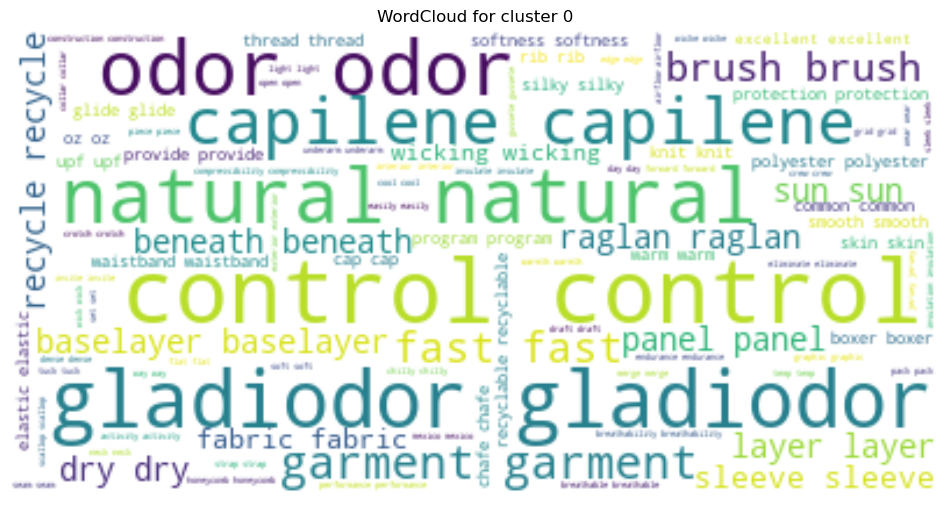

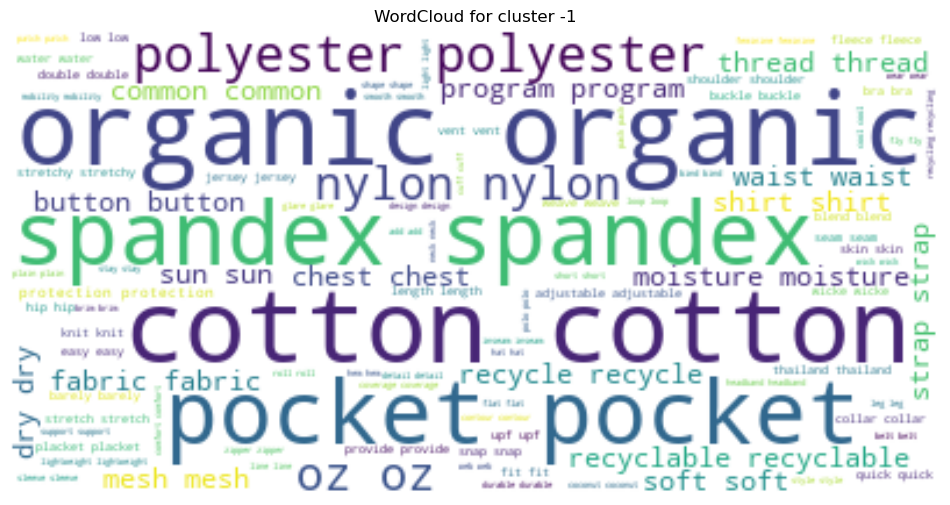

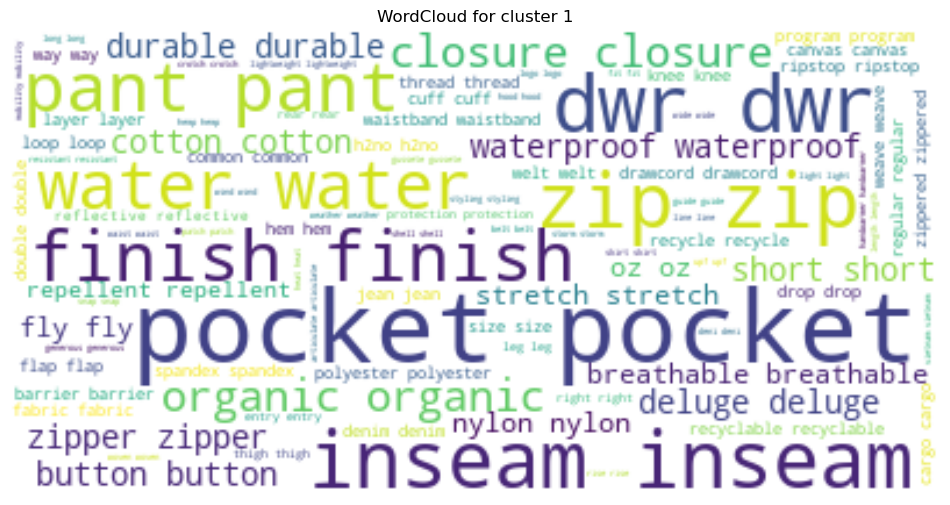

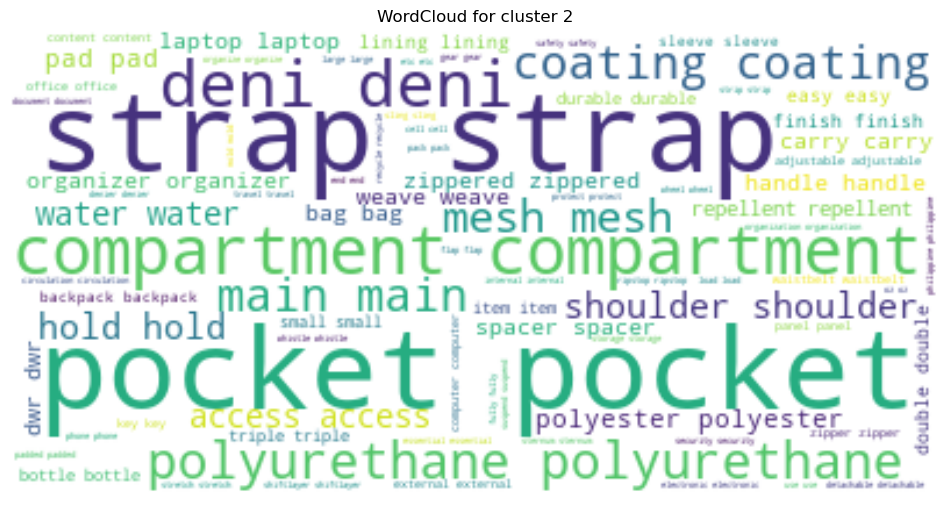

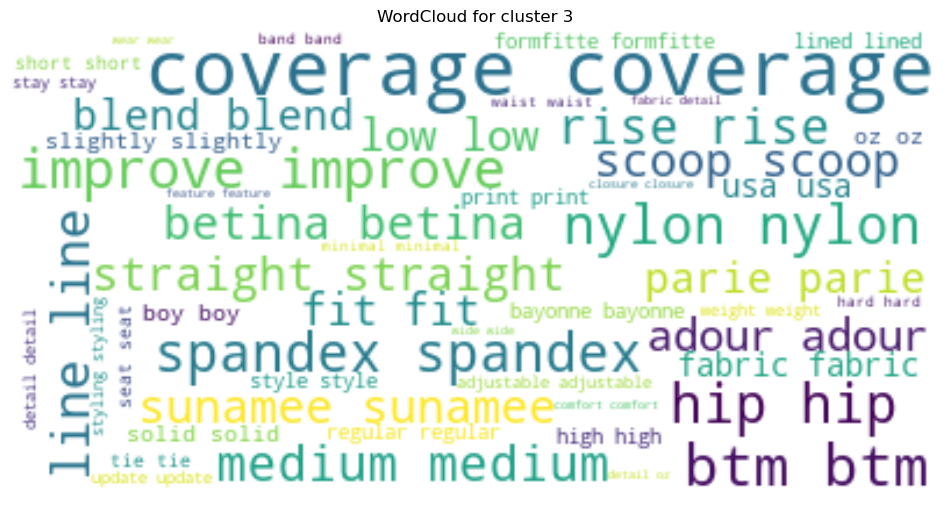

...

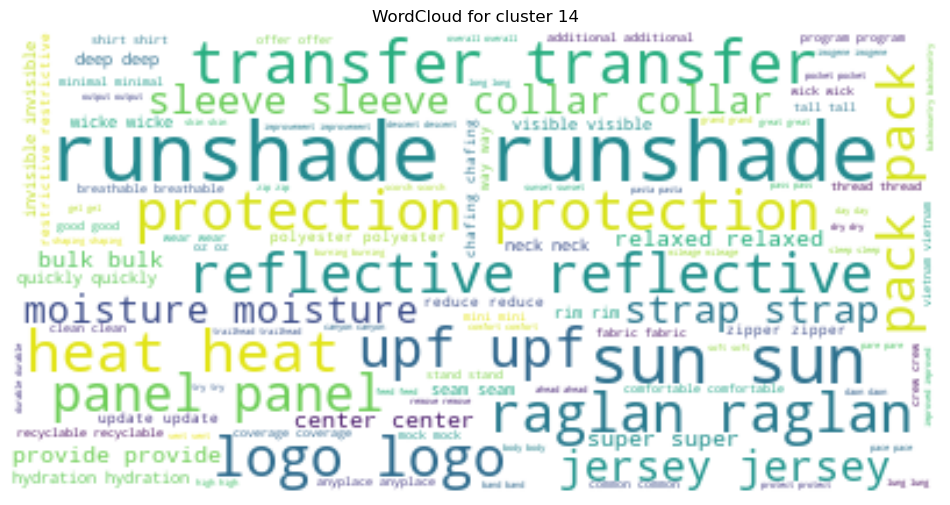

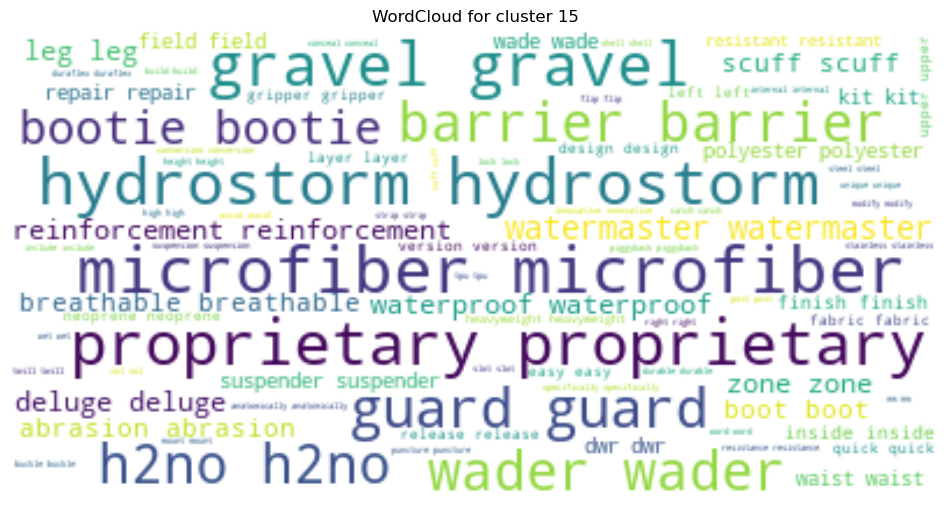

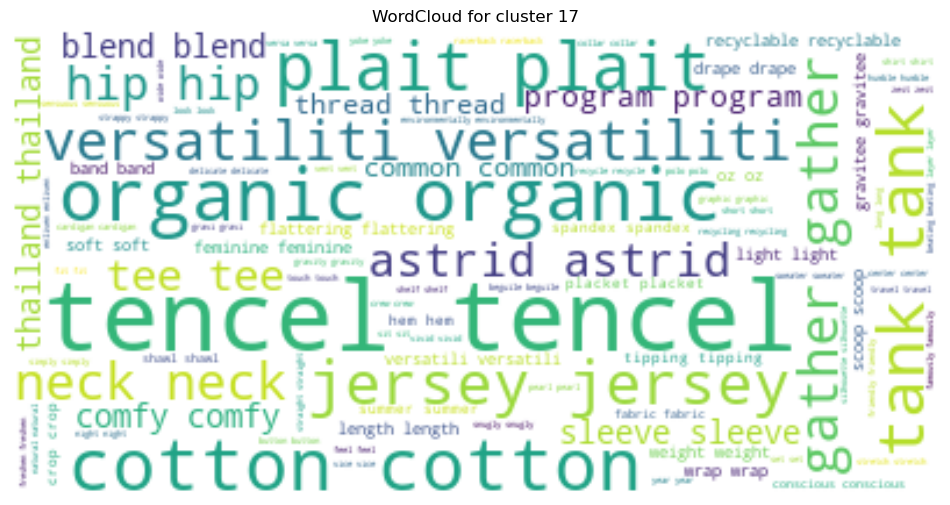

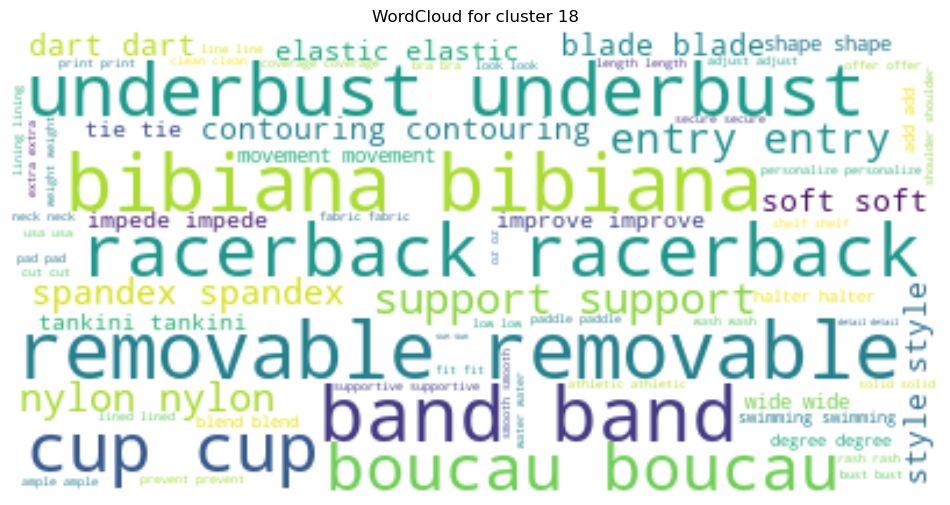

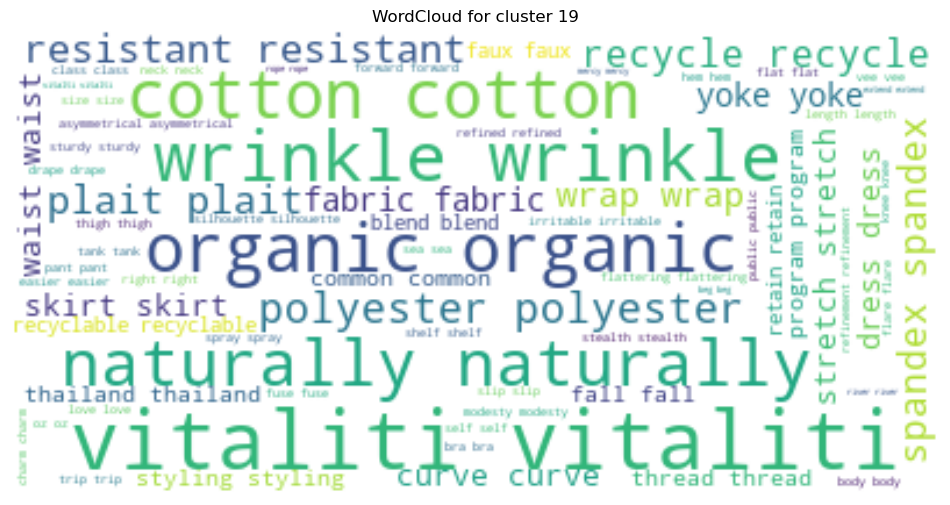

In [104]:
# from wordcloud import WordCloud
# import matplotlib.pyplot as plt

vectorizer = TfidfVectorizer(ngram_range = k_ngram)    # default ngram_range=(1, 1)
X = vectorizer.fit_transform(df["final_desc2"])

tfidf_matrix_normalized = normalize(X)

dbscan = DBSCAN(eps=.8, min_samples=5, metric="cosine")  
dbscan.fit(tfidf_matrix_normalized)

clusters = {}
for i, label in enumerate(labels):
    if label not in clusters:
        clusters[label] = []
    clusters[label].append(i)

for cluster, documents in clusters.items():
    cluster_words = []
    for doc_index in documents:
        non_zero_indices = X[doc_index].nonzero()[1]
        terms = vectorizer.get_feature_names_out()[non_zero_indices]
        tfidf_scores = X[doc_index, non_zero_indices].toarray()[0] 
        for term, score in zip(terms, tfidf_scores):
            cluster_words.extend([term] * int(score * 100))  # scale-up to the TF-IDF score 
    wordcloud = WordCloud(background_color='white').generate(' '.join(cluster_words))
    # wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(cluster_words))

    # Afficher le WordCloud
    plt.figure(figsize=(k_Width, k_Height))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('WordCloud for cluster {}'.format(cluster))
    plt.axis('off')
    plt.show()



In [105]:
# from sklearn.cluster import DBSCAN
# from sklearn.metrics.pairwise import cosine_distances

# Calculer les distances cosinus entre les documents
cosine_dist = cosine_distances(X)

# Appliquer DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=2, metric='precomputed')
clusters = dbscan.fit_predict(cosine_dist)

# Afficher les résultats
unique_clusters = set(clusters)
for cluster_id in unique_clusters:
    if cluster_id == -1:  # -1 représente les points considérés comme du bruit par DBSCAN
        print("Documents considérés comme du bruit:")
        for idx, label in enumerate(clusters):
            if label == -1:
                print(df["final_desc2"][idx])
        continue
    print("Cluster", cluster_id, ":")
    for idx, label in enumerate(clusters):
        if label == cluster_id:
            print(df["final_desc2"][idx]) 

Cluster 0 :
alpine guide pant skin climb ice switch rock traverse knife edge ridge boogie durable weather resistant breathable soft shell pant stride mountain endeavor midweight stretch woven polyester restrict brushed interior maintain skin comfort way zippered fly thing easy harness gussete zippered cuff position snap tie loop water resistant zippered pocket thigh hip recyclable common thread recycle program detail durable stretch weave polyester recycle dwr durable water repellent finish water wind resistant highly breathable brush interior skin comfort waistband belt loop elastic way zippered fly external pocket slash glue thigh hip highly water resistant dwr finish zipper gussete zipper cuff position adjustable setting tie loop fabric oz deni polyester recycle spandex deluge dwr finish recyclable common thread recycling program weight g oz vietnam
alpine guide pant skin climb ice switch rock traverse knife edge ridge boogie durable weather resistant breathable soft shell pant stri

## Model 1 - Fine tuning ?

## Model 2 - Similarities

In [106]:
# https://chatgpt.com/c/beadf33f-69a2-4de7-adea-1b23f5a215fe
# https://github.com/2nzi/JEDHA-Projet-5b-TheNorthFace/blob/main/TNF.ipynb

similarities = cosine_similarity(X, X)
# print(similarities)


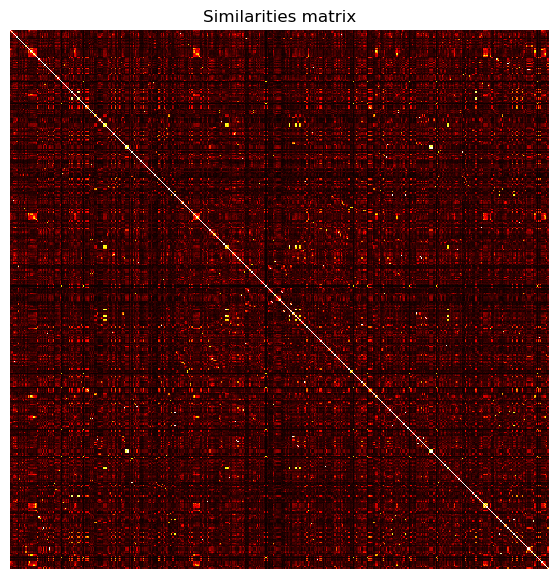

In [107]:
plt.figure(figsize=(k_Width,k_Height))
plt.imshow(similarities, cmap='hot', interpolation='nearest')
plt.title('Similarities matrix')
plt.xlabel('Documents')
plt.ylabel('Documents')
# plt.colorbar()
plt.axis('off')
plt.show()

In [108]:
# How to get the 4 most similar documents 
doc_index = 0
similar_docs_indices = similarities[doc_index].argsort()[:-5:-1]  
print(f"Documents most similar to document {doc_index} :")
for index in similar_docs_indices:
    if index != doc_index:  # except the document itself
        print(f"- Document {index:>3} (similarity : {similarities[doc_index][index]:.3f})")


Documents most similar to document 0 :
- Document  18 (similarity : 0.481)
- Document 493 (similarity : 0.430)
- Document   1 (similarity : 0.361)


In [109]:
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.metrics.pairwise import cosine_similarity



similarities = cosine_similarity(X[0], X)

sorted_indices = similarities.argsort()[0][::-1][1:4]  # Indices des 3 documents les plus similaires (à l'exclusion du document lui-même)

for index in sorted_indices:
    print("Document similaire :", df["final_desc2"][index])


Document similaire : cap boxer brief bivy belay form fitting capilene boxer brief stay dry comfortable recycle polyester underwear excel moisture wicke gladiodor natural odor control garment expose elastic waistband brush softness hem coverstitche smooth glide beneath short pant fully function fly supportive panel cover inseam size m recyclable common thread recycle program detail moisture wicke capilene fabric gladiodor exceptional skin comfort natural odor control garment brush elastic waistband supportive panel cover stitch hem smooth glide short pant restrict mobility inseam size m fabric oz recycle polyester gladiodor natural odor control garment recyclable common thread recycling program weight g oz usa
Document similaire : active boxer brief fuss travel companion skivvy love sink creek bath dry flash quick wicke underwear breathe exceptionally comfortable condition expose elastic waistband brush chafe softness hem coverstitche smooth glide beneath short pant inseam size m easy a

# Part 2 - Recommender system

# Part 3 : Topic modeling

# SCRAP Book

In [110]:
# import tkinter as tk
# from tkinter import messagebox
# from datetime import datetime
# # from my_model import my_pred

# def predict():
#     try:
#         heure_str = entry_heure.get()
#         heure = datetime.strptime(heure_str, "%H:%M")
        
#         prediction = 42 #my_pred(heure)
        
#         messagebox.showinfo("Résultat de la prédiction", f"La prédiction pour l'heure {heure_str} est {prediction}")
#     except ValueError:
#         messagebox.showerror("Erreur", "Format d'heure incorrect. Utilisez le format HH:MM")

# window = tk.Tk()
# window.title("Interface de Prédiction")

# label_heure = tk.Label(window, text="Entrez l'heure (format HH:MM) : ")
# label_heure.pack()
# entry_heure = tk.Entry(window)
# entry_heure.pack()

# bouton_prediction = tk.Button(window, text="Prédire", command=predict)
# bouton_prediction.pack()

# window.mainloop()
